In [ ]:
%%capture
!pip install timm torchsummary tqdm grad-cam

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 431 kB 5.4 MB/s 
     |████████████████████████████████| 16.8 MB 31.3 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Created wheel for grad-cam: filename=grad_cam-1.3.9-py3-none-any.whl size=25984 sha256=a3ba2d33cc084909692901f66753c17bd3ea48a652cbae5e0b29043cc2c3148d
  Stored in directory: /root/.cache/pip/wheels/65/e8/6e/6eedfbe3f0007dfd8116e6820b69691c4103d89ad2ae8c69ff
Successfully built grad-cam


In [ ]:
import os
import cv2
import numpy as np
import pandas as pd
from math import ceil
from time import time
from tqdm.auto import tqdm
import multiprocessing as mp
from matplotlib import pyplot as plt
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

import timm
import torch
import torchvision
import torchsummary
from torch import nn
from torch.optim import Adam
from torchvision import transforms, utils
from torch.utils.data import Dataset, DataLoader
from torch.utils.tensorboard import SummaryWriter

from pytorch_grad_cam.utils.image import show_cam_on_image
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam import GradCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, EigenGradCAM, LayerCAM, FullGrad

%matplotlib inline

In [ ]:
np.random.seed(42)
torch.manual_seed(42)

## Setting up the GPU/CPU
will depend on the selected runtime for colab

In [ ]:
device = 'cuda:0' if torch.cuda.is_available() else 'cpu'
device

'cpu'

## Loading images to check

In [ ]:
test_image_path_1  = '/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/Original/1.training/1.training/436219-7159-48987-[1, 1, 0].png'
test_image_path_2  = '/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/cutmix_augmentation/0000-[0, 1, 1].png'
valid_image_path   = '/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/Original/2.validation/2.validation/img/00.png'
valid_mask_path    = '/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Dataset/Original/2.validation/2.validation/mask/00.png'

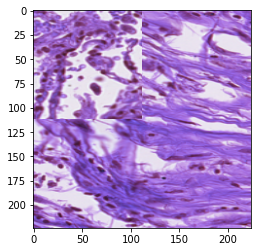

In [ ]:
img = cv2.resize(cv2.imread(test_image_path_2), (224, 224))
plt.imshow(img)

In [ ]:
test_image_1  = cv2.resize(cv2.imread(test_image_path_1), (224, 224))
test_image_2  = cv2.resize(cv2.imread(test_image_path_2), (224, 224))
valid_image = cv2.resize(cv2.imread(valid_image_path), (224, 224))
valid_mask  = cv2.resize(cv2.imread(valid_mask_path), (224, 224))

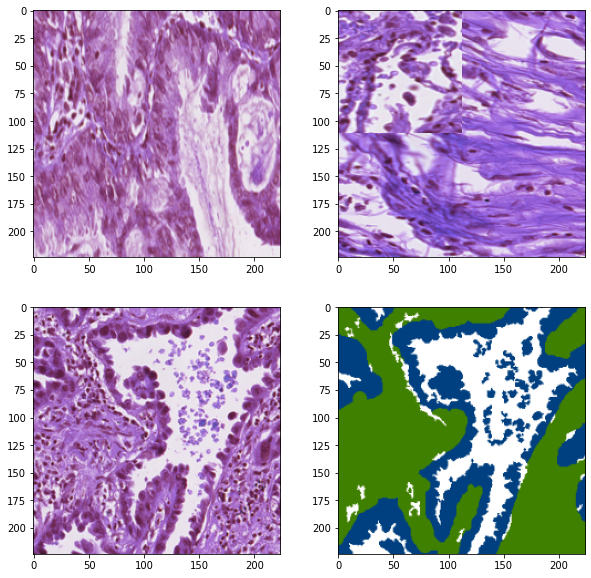

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 2, 4)
plt.imshow(cv2.cvtColor(valid_mask, cv2.COLOR_BGR2RGB))

In [ ]:
def preprocess_image(img: np.ndarray, mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5], resized = (224, 224)) -> torch.Tensor:
  
  preprocessing = transforms.Compose([
                                      transforms.ToTensor(),
                                      transforms.Resize((224, 224)),
                                      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]),
                                      ])
  return preprocessing(img.copy()).unsqueeze(0)

In [ ]:
def reshape_transform(tensor, height=7, width=7):
  result = tensor[:, 1 :  , :].reshape(tensor.size(0),
                                       height, width, tensor.size(2))
  
  # Bring the channels to the first dimension,
  # like in CNNs.
  result = result.transpose(2, 3).transpose(1, 2)
  return result

# Creating models

In [ ]:
cutmix_model_vit_base_patch32_224_01 = timm.create_model('vit_base_patch32_224', pretrained = True, num_classes = 3,
                                                         drop_rate = 0.2, attn_drop_rate = 0.2).to(device)

cutmix_model_vit_base_patch32_224_01.load_state_dict(torch.load(f='/content/drive/MyDrive/Newcastle University/Final Project and Dissertation/Models/cutmix_model_vit_base_patch32_224_01.pth',
                                                      map_location=torch.device(device)))

<All keys matched successfully>

In [ ]:
cutmix_model_vit_base_patch32_224_01.eval()

In [ ]:
target_layer = [cutmix_model_vit_base_patch32_224_01.blocks[-1].norm1]
target_layer

[LayerNorm((768,), eps=1e-06, elementwise_affine=True)]

# Configuring images

In [ ]:
test_image_1_tensor = preprocess_image(test_image_1).to(device)
test_image_2_tensor = preprocess_image(test_image_2).to(device)
valid_image_tensor  = preprocess_image(valid_image).to(device)

# GradCAM

In [ ]:
cam = GradCAM(model = cutmix_model_vit_base_patch32_224_01, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

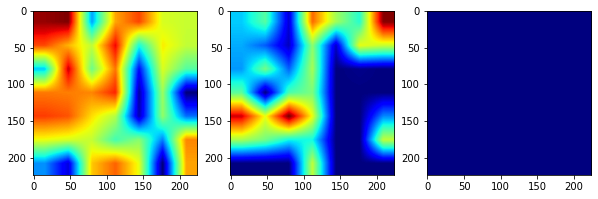

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

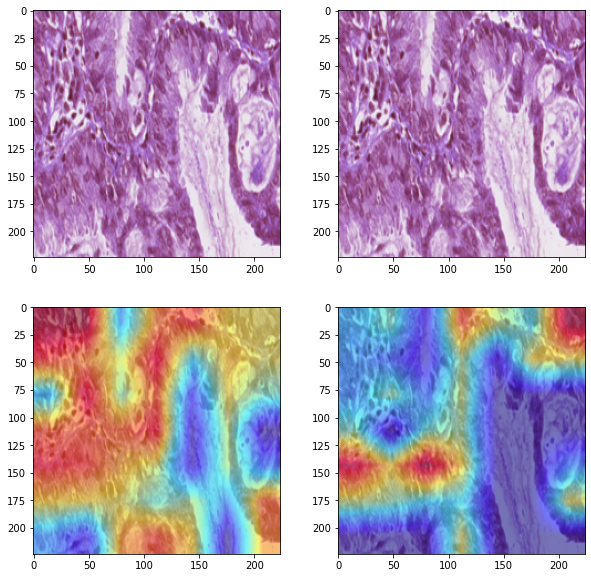

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

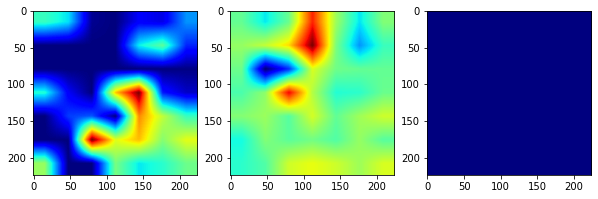

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

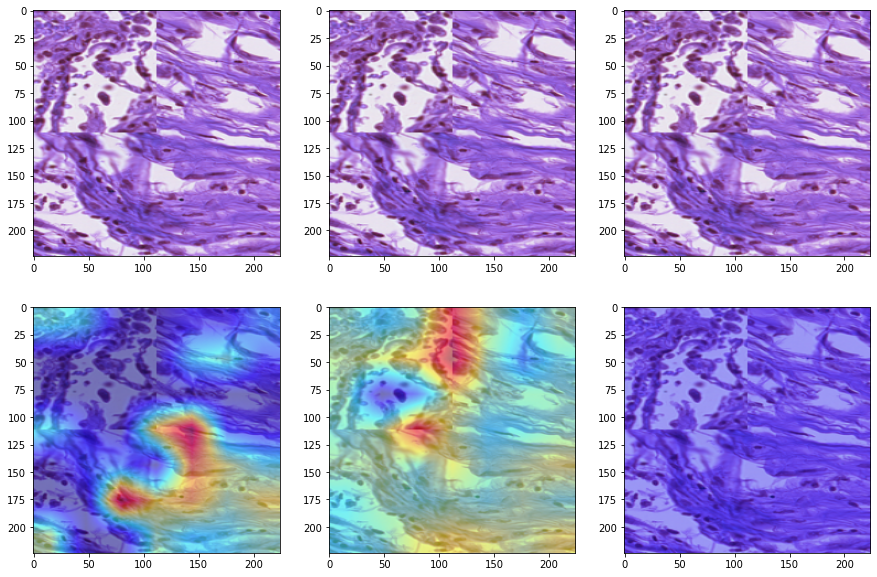

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

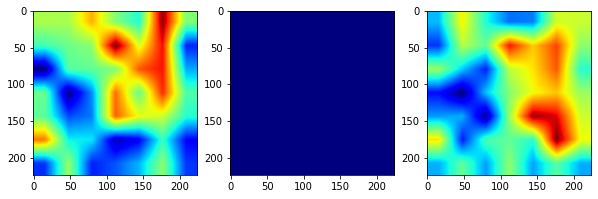

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

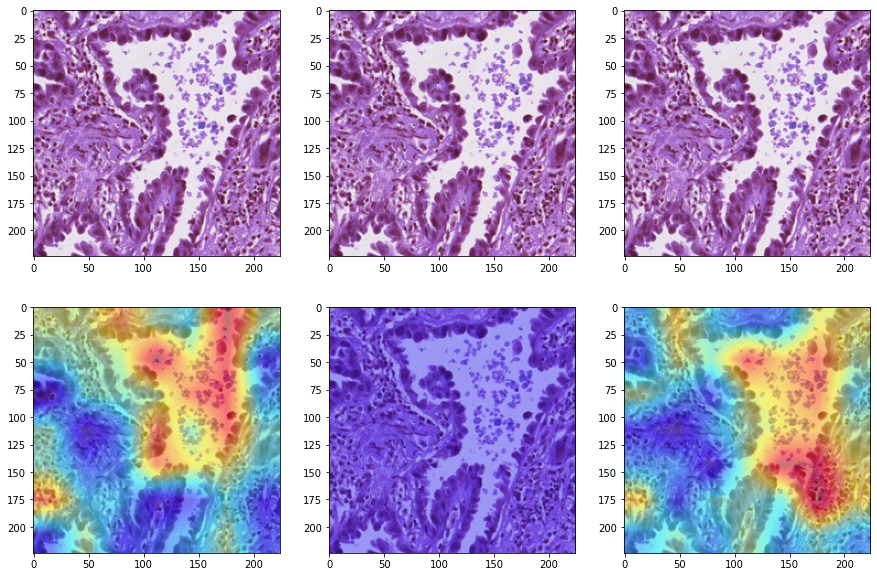

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# ScoreCAM

In [ ]:
cam = ScoreCAM(model = cutmix_model_vit_base_patch32_224_01, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 48/48 [01:56<00:00,  2.43s/it]


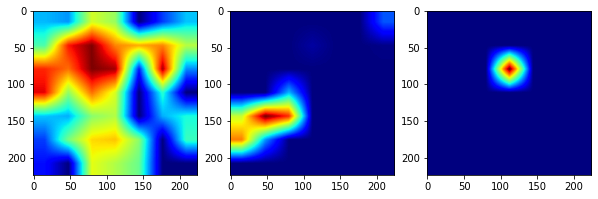

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

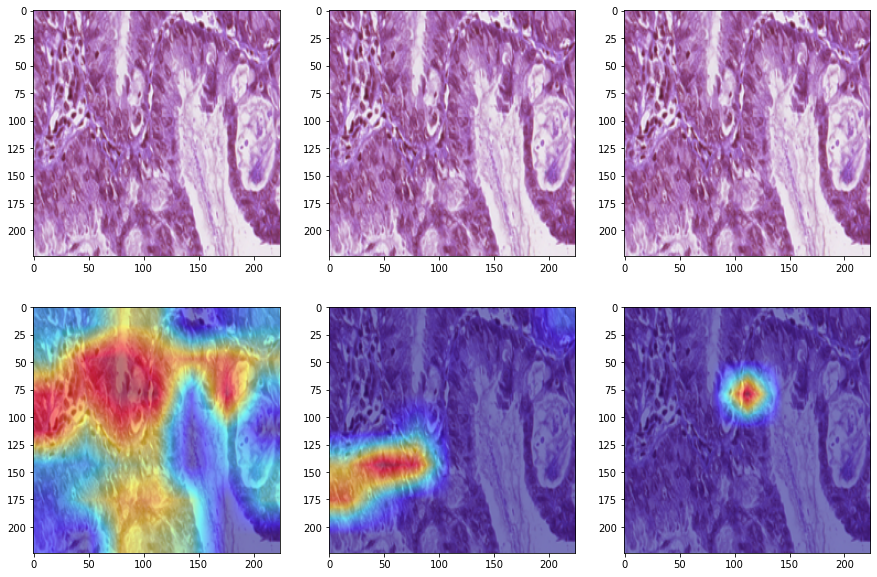

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam3[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

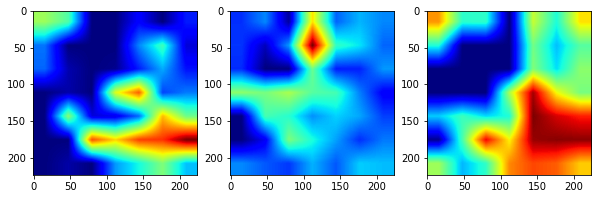

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

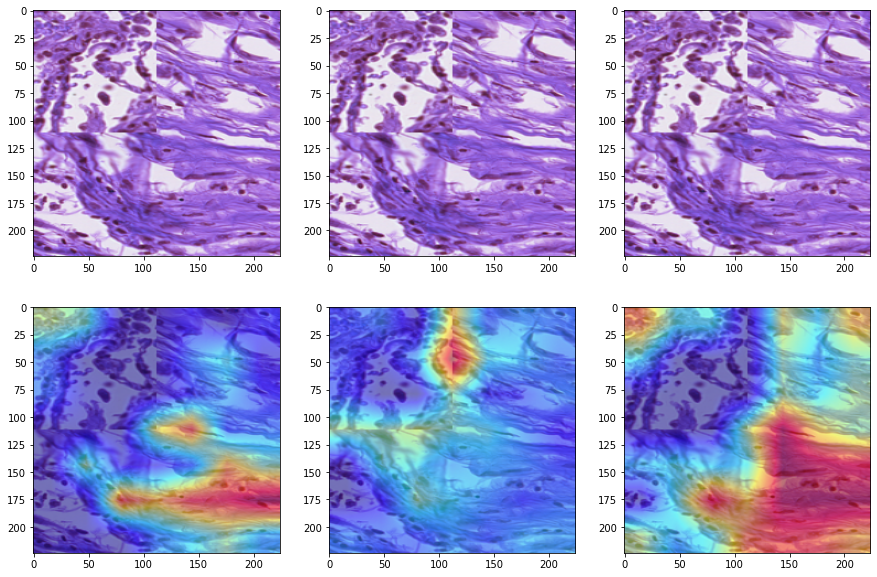

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

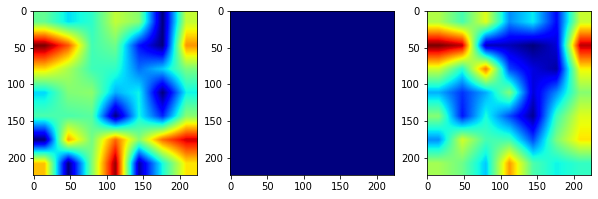

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

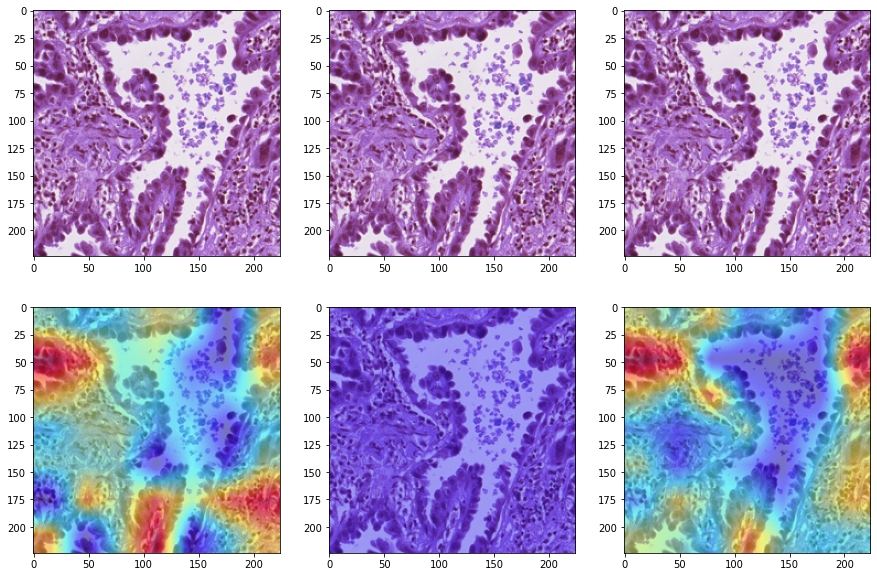

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# GradCAM++

In [ ]:
cam = GradCAMPlusPlus(model = cutmix_model_vit_base_patch32_224_01, target_layers=target_layer,
                      reshape_transform=reshape_transform)

## image 1

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

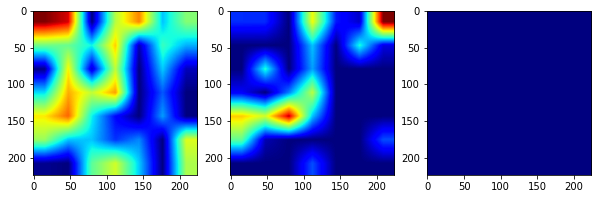

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

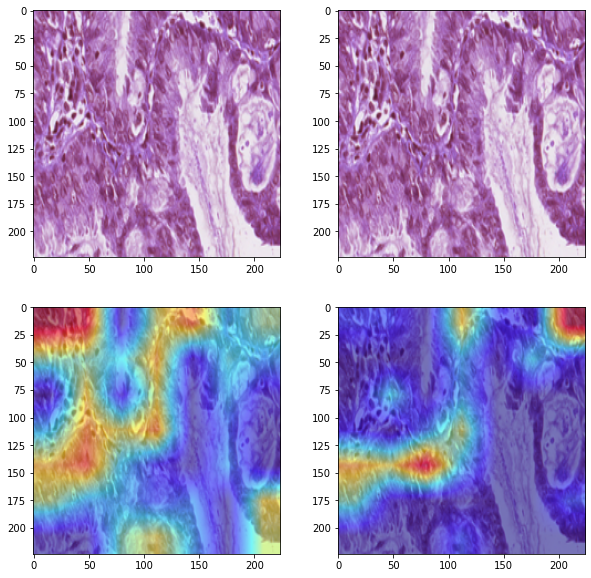

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

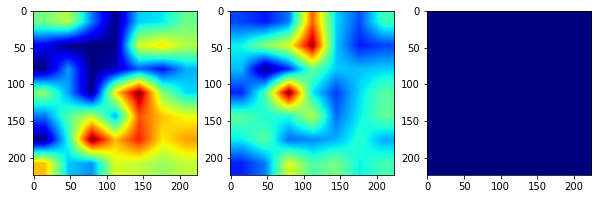

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

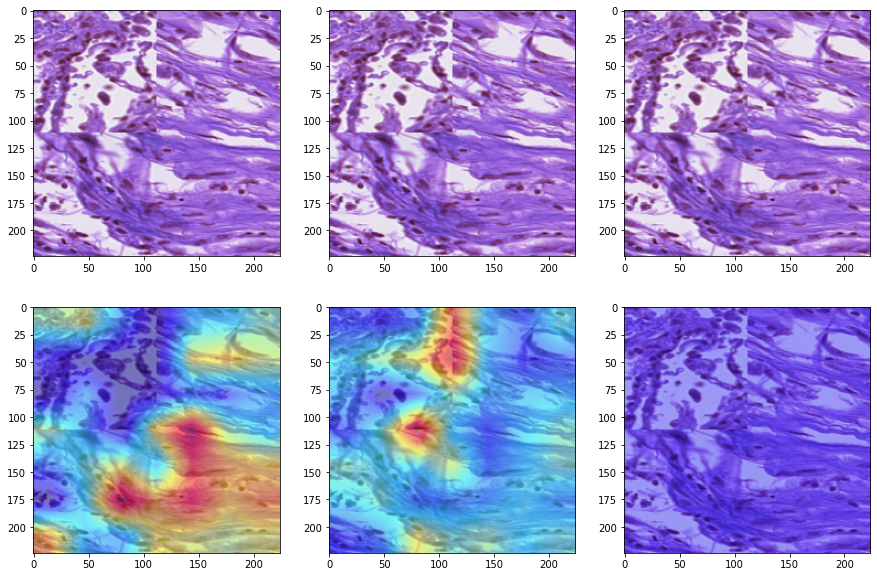

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

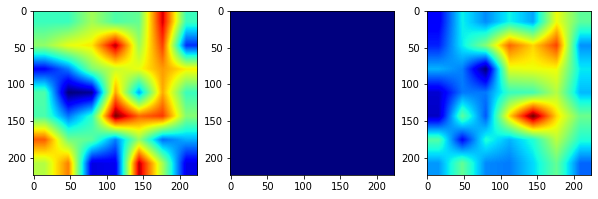

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

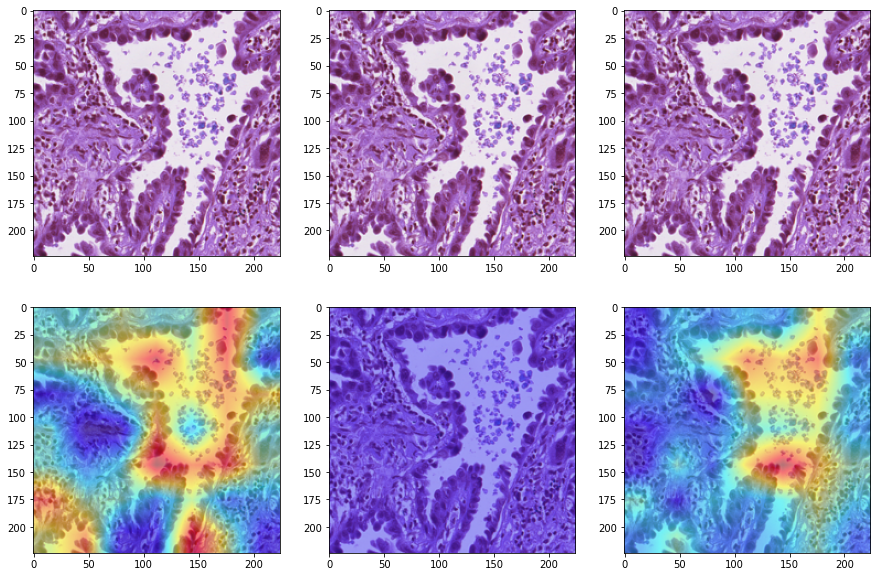

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# AblationCAM

In [ ]:
from pytorch_grad_cam.ablation_layer import AblationLayerVit

In [ ]:
cam = AblationCAM(model = cutmix_model_vit_base_patch32_224_01, target_layers=target_layer,
                  reshape_transform=reshape_transform, ablation_layer=AblationLayerVit())

## image 1

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 24/24 [01:54<00:00,  4.78s/it]


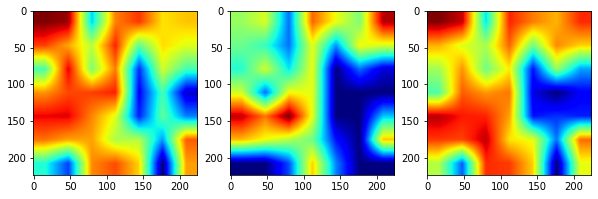

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

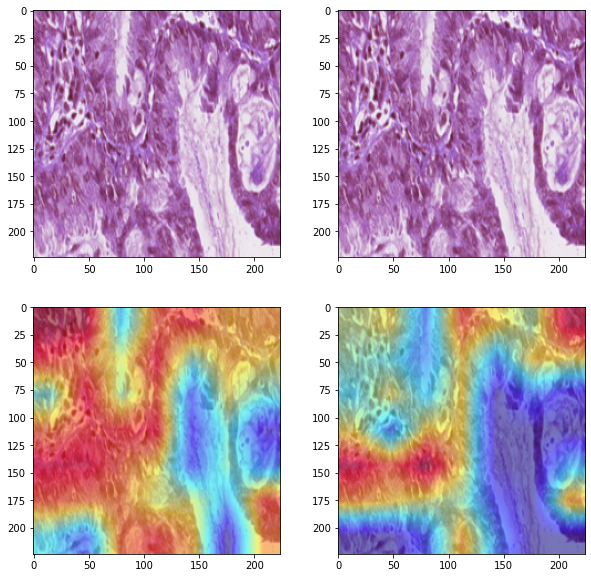

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 24/24 [02:00<00:00,  5.02s/it]


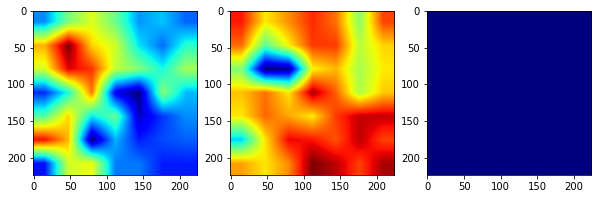

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

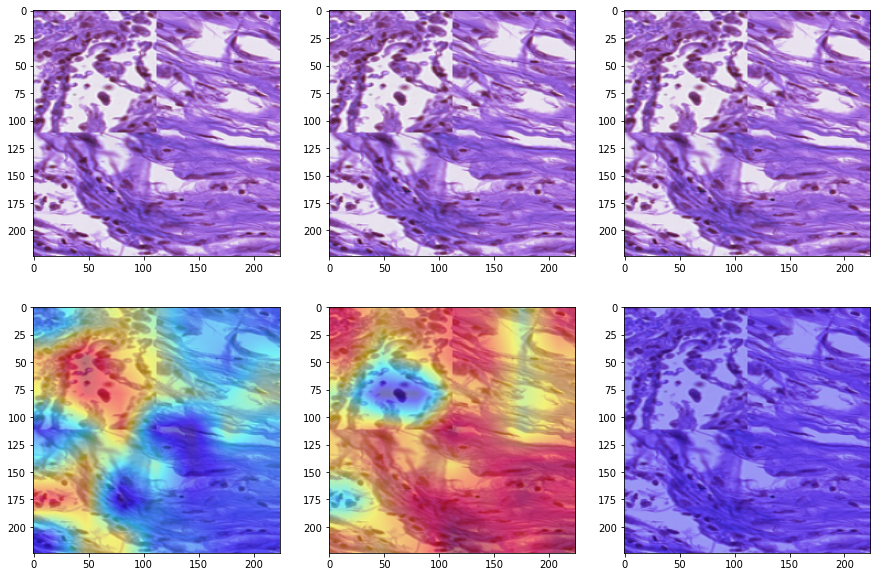

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

100%|██████████| 24/24 [01:57<00:00,  4.91s/it]


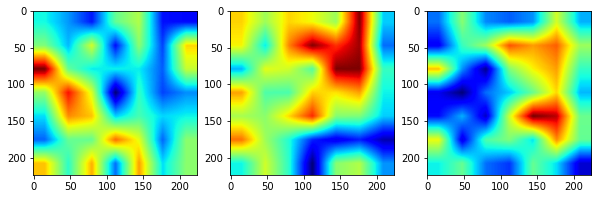

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

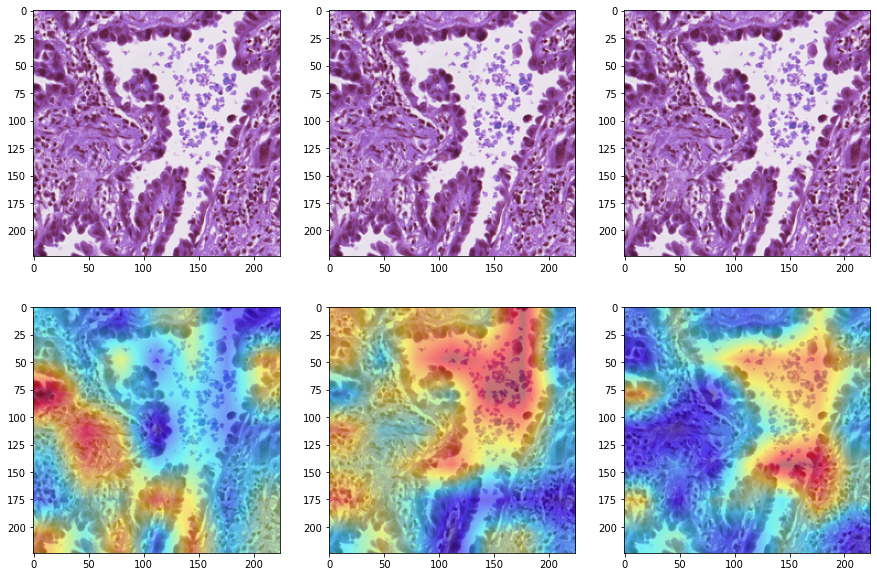

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# XGradCAM

In [ ]:
cam = XGradCAM(model = cutmix_model_vit_base_patch32_224_01, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

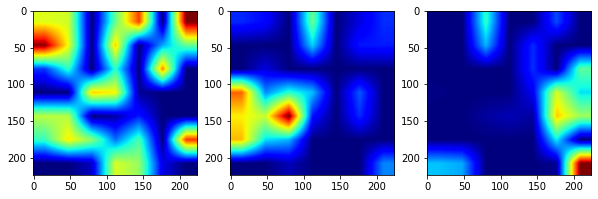

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

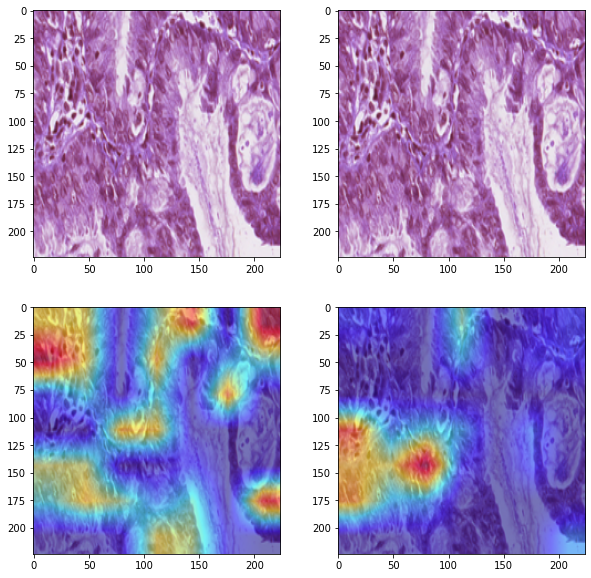

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

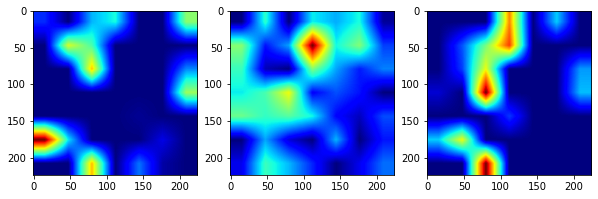

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

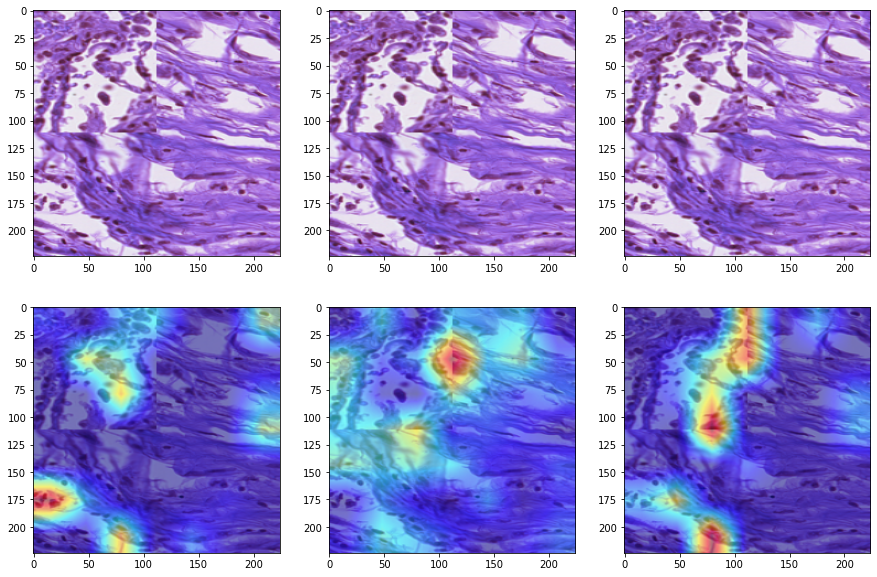

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

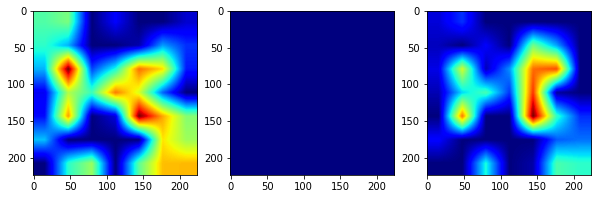

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

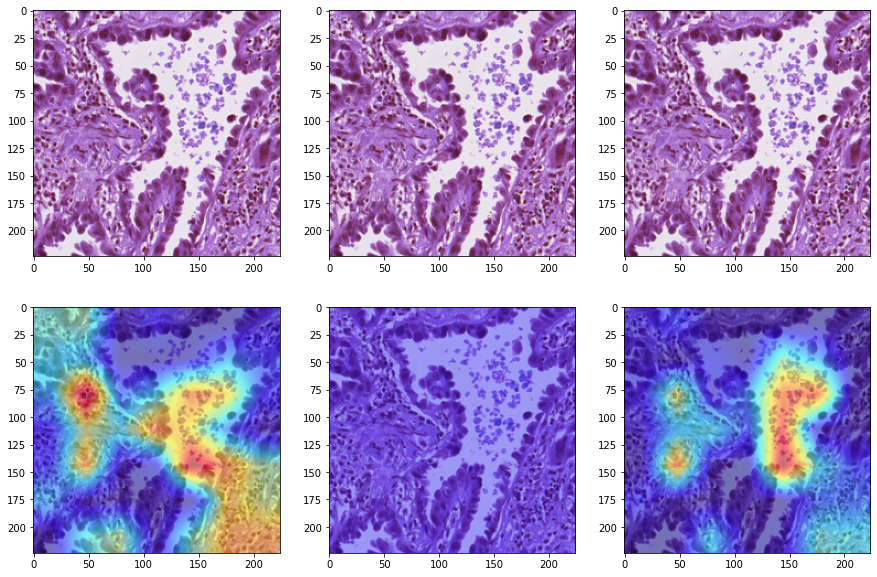

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# EigenCAM

In [ ]:
cam = EigenCAM(model = cutmix_model_vit_base_patch32_224_01, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

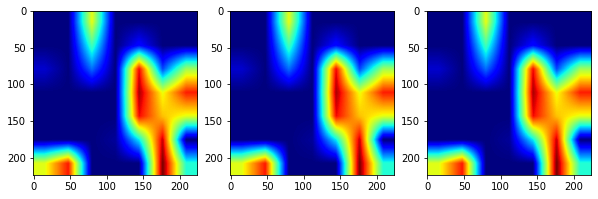

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

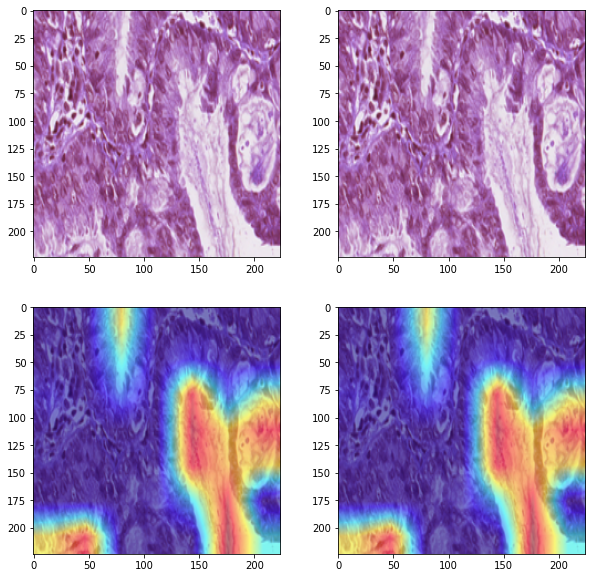

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

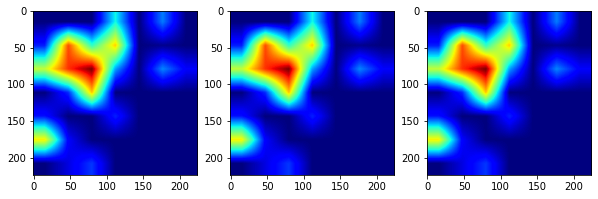

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

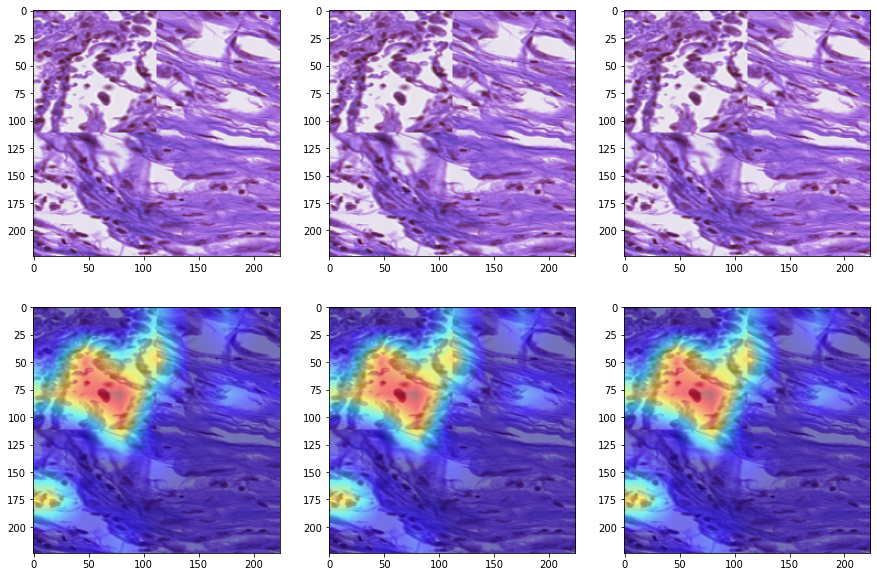

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

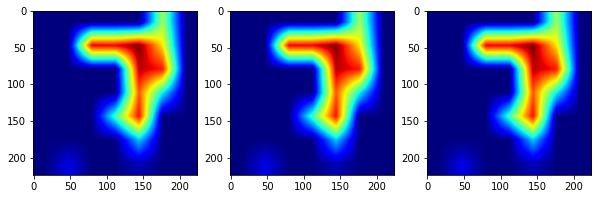

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

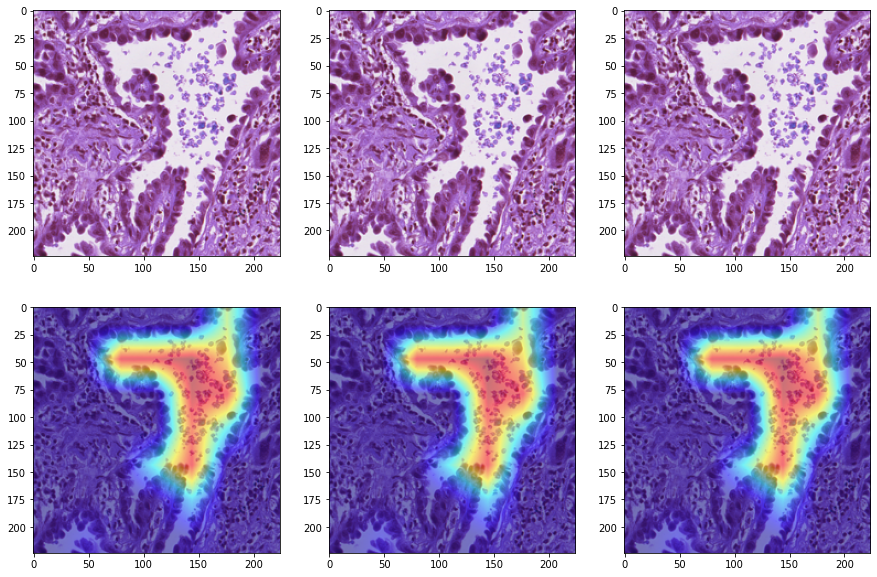

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# EigenGradCAM

In [ ]:
cam = EigenGradCAM(model = cutmix_model_vit_base_patch32_224_01, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

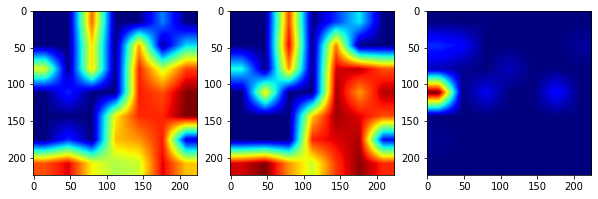

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

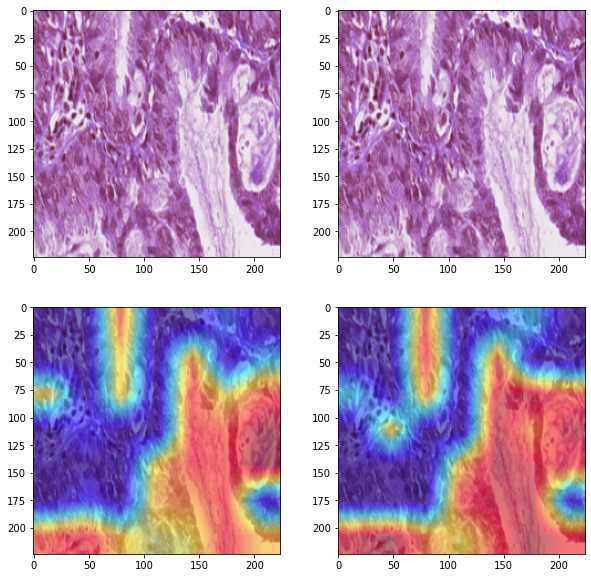

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

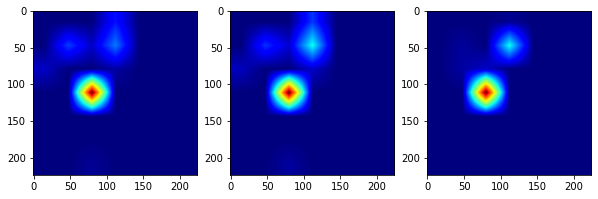

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

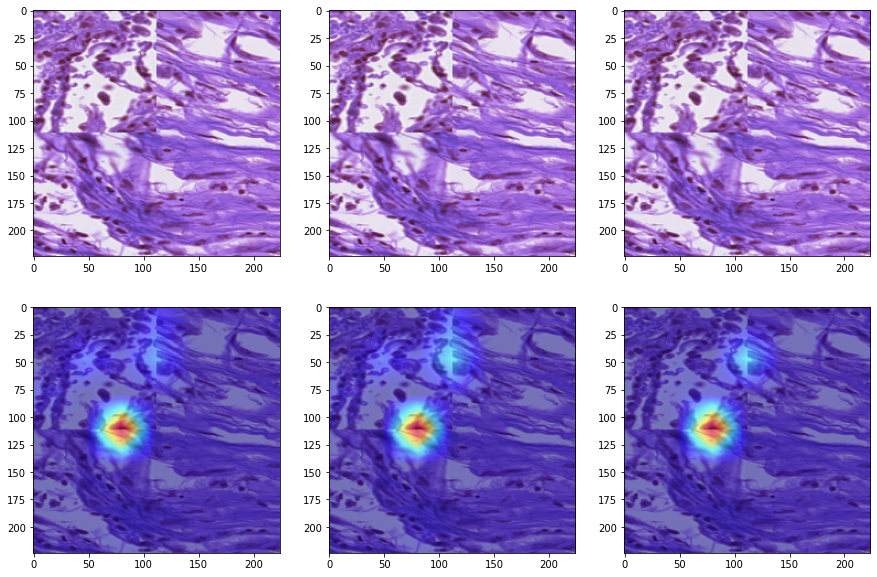

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

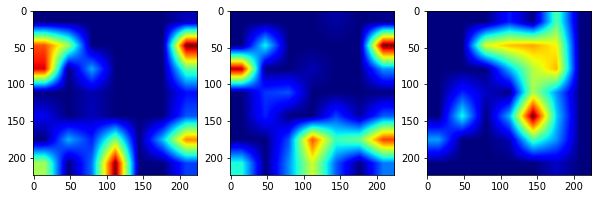

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

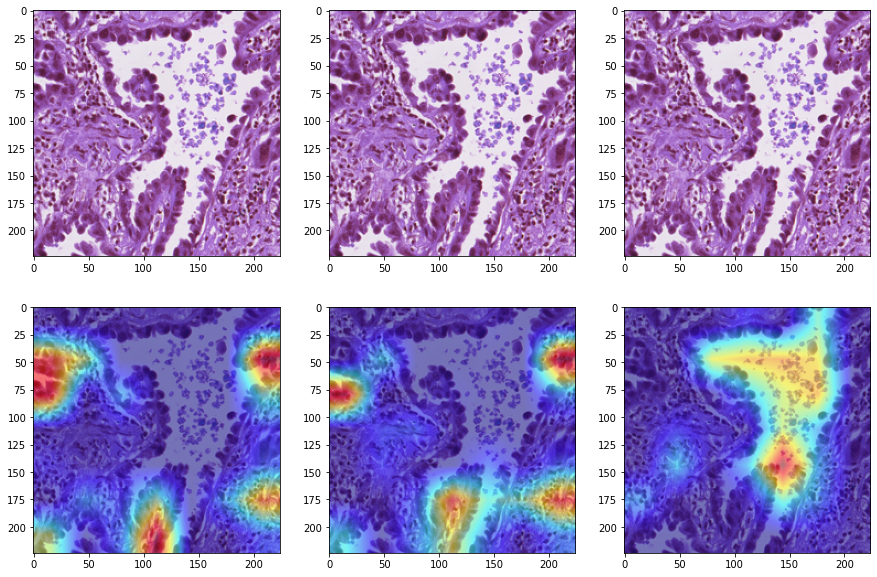

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# LayerCAM

In [ ]:
cam = LayerCAM(model = cutmix_model_vit_base_patch32_224_01, target_layers=target_layer,
              reshape_transform=reshape_transform)

## image 1

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_1_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

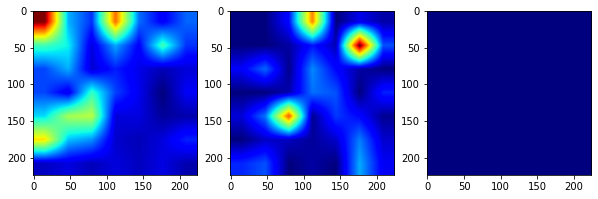

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

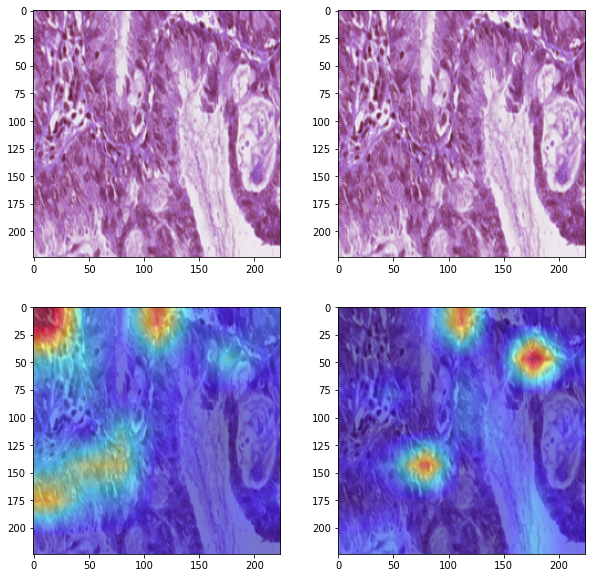

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

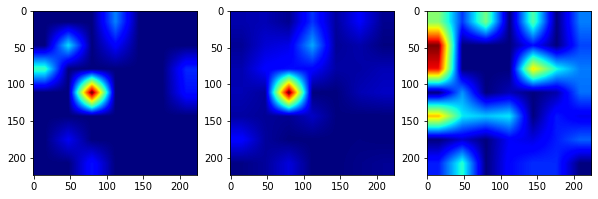

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

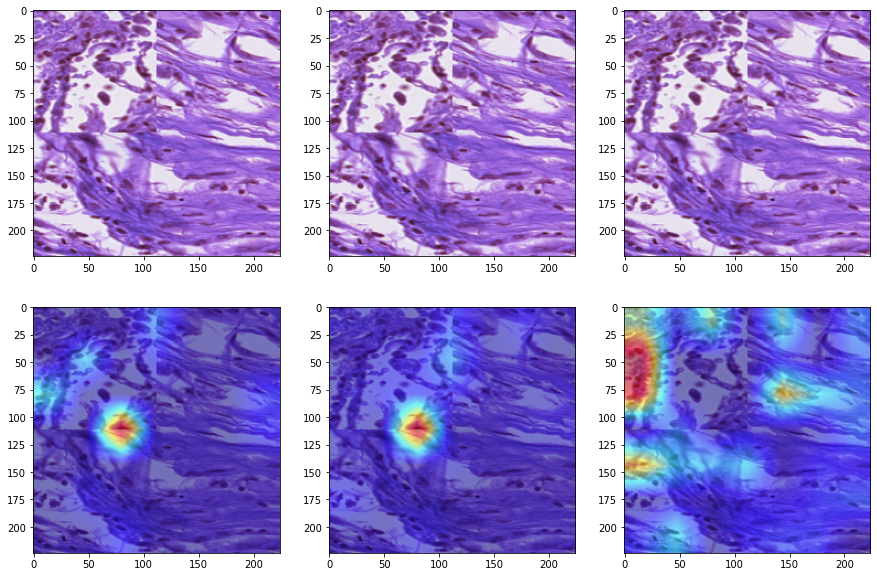

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

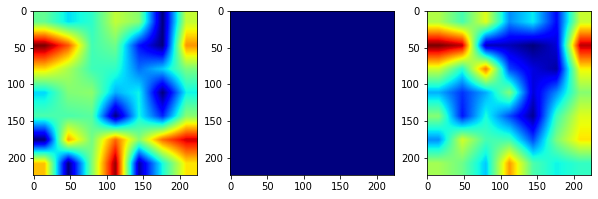

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

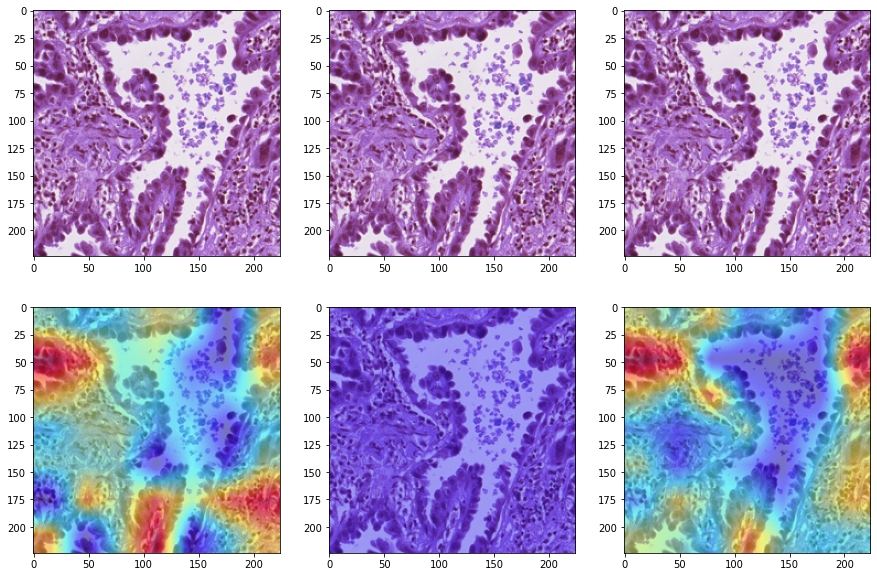

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# Attention Rollout

In [ ]:
! git clone https://github.com/jacobgil/vit-explain vit_explain

fatal: destination path 'vit_explain' already exists and is not an empty directory.


In [ ]:
from vit_explain.vit_rollout import VITAttentionRollout
from vit_explain.vit_grad_rollout import VITAttentionGradRollout

# Native

In [ ]:
attention_rollout = VITAttentionRollout(cutmix_model_vit_base_patch32_224_01, head_fusion='max',
                                        discard_ratio=0.9)

In [ ]:
test_image_1_tensor.shape

torch.Size([1, 3, 224, 224])

## image 1

In [ ]:
mask_1 = attention_rollout(test_image_1_tensor)

RuntimeError: ignored

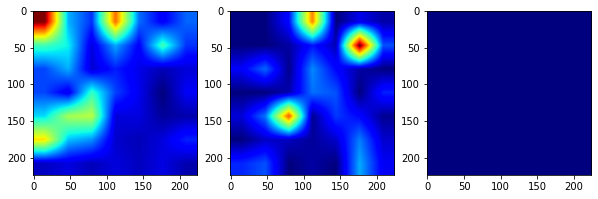

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

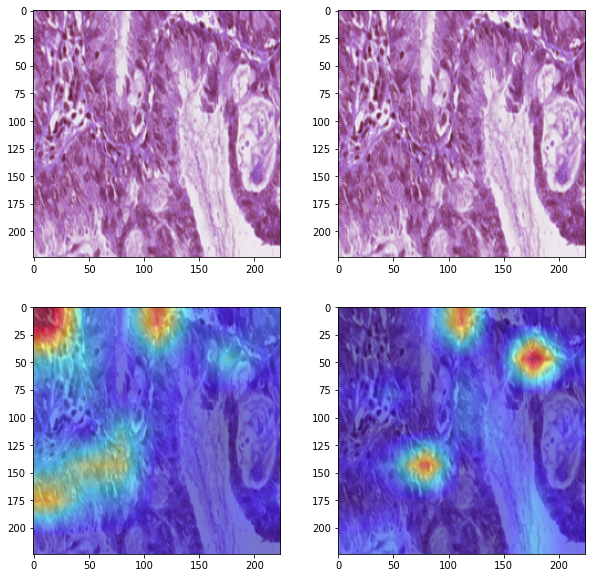

In [ ]:
fig = plt.figure(figsize=(10, 10))

ax = fig.add_subplot(2, 2, 1)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 2)
plt.imshow(test_image_1)

ax = fig.add_subplot(2, 2, 3)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 2, 4)
plt.imshow(show_cam_on_image(test_image_1/255, grayscale_cam2[0, :], use_rgb=True))

## image 2

In [ ]:
grayscale_cam1 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=test_image_2_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

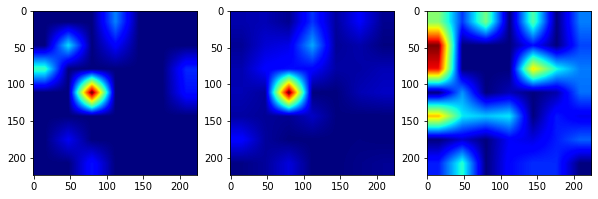

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

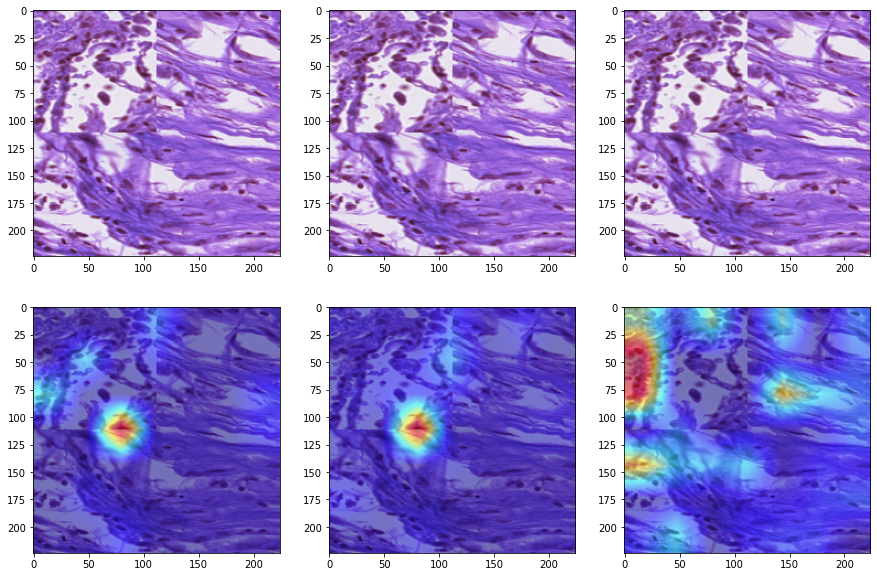

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(test_image_2)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(test_image_2/255, grayscale_cam3[0, :], use_rgb=True))

## valid Image

In [ ]:
grayscale_cam1 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([0]))])
grayscale_cam2 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([1]))])
grayscale_cam3 = cam(input_tensor=valid_image_tensor, targets=[ClassifierOutputTarget(np.array([2]))])

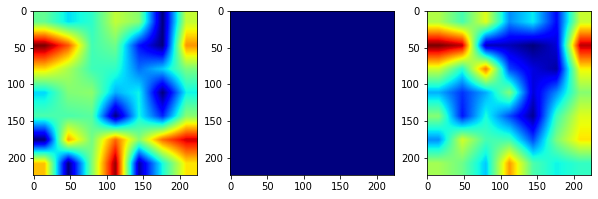

In [ ]:
fig = plt.figure(figsize=(10, 15))

ax = fig.add_subplot(1, 3, 1)
plt.imshow(grayscale_cam1[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 2)
plt.imshow(grayscale_cam2[0, :], cmap='jet')

ax = fig.add_subplot(1, 3, 3)
plt.imshow(grayscale_cam3[0, :], cmap='jet')

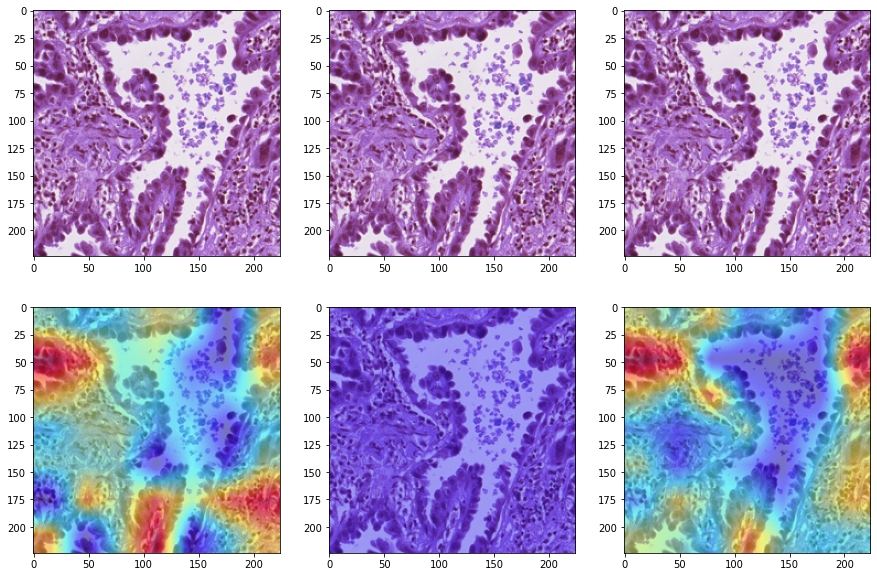

In [ ]:
fig = plt.figure(figsize=(15, 10))

ax = fig.add_subplot(2, 3, 1)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 2)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 3)
plt.imshow(valid_image)

ax = fig.add_subplot(2, 3, 4)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam1[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 5)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam2[0, :], use_rgb=True))

ax = fig.add_subplot(2, 3, 6)
plt.imshow(show_cam_on_image(valid_image/255, grayscale_cam3[0, :], use_rgb=True))

# Grad Rollout

In [ ]:
grad_rollout = VITAttentionGradRollout(cutmix_model_vit_base_patch32_224_01, discard_ratio=0.9)

In [ ]:
mask_1 = grad_rollout(test_image_1_tensor, category_index=0)

RuntimeError: ignored